<a href="https://colab.research.google.com/github/Datamogorov/Machine-learning-projects/blob/master/red_neuronal__perros_y_gatos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


Ejemplo de entrenamiento de red neuronal utilizando imagenes a color de perros y gatos
1. Cargar los datos: Archivo comprimido de 4000 imagenes JPG. Tres carpetas, entrenemiento(2000), de prueba(1000) y de validacion (1000)
 - Colab carga los datos en el directorio '/content'

In [59]:
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras

print(tf.__version__)

2.2.0


In [ ]:
from google.colab import files
files.upload()

In [86]:
!ls

cats_and_dogs_small.zip  sample_data


2. Utilizaremos librerias de python para acceder a los archivos
- Descomprimmos los archivos

In [88]:
import os
import zipfile

local_zip = '/content/cats_and_dogs_small.zip'

zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('/content')
zip_ref.close()

3. Repartimos los datos en cada conjunto (entrenamiento, validacion, prueba)


In [89]:
base_dir = '/content/cats_and_dogs_small'

train_dir =      os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir =       os.path.join(base_dir, 'test')

# Directorio con las imagenes de training 
train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directorio con las imagenes de validation
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

# Directorio con las imagenes de test
test_cats_dir = os.path.join(test_dir, 'cats')
test_dogs_dir = os.path.join(test_dir, 'dogs')


En este caso no es necesario etiquetar las imagenes de forma explicita como perro o gato ya que al organizar las imagenes en subdirectorios como lo hemos hecho las etiquetas se generan automaticamente. Comprobamos que todo esté en orden.

In [91]:
train_cat_fnames = os.listdir( train_cats_dir )
print(train_cat_fnames[:5])

train_dog_fnames = os.listdir( train_dogs_dir )
print(train_dog_fnames[:5])

validation_cat_fnames = os.listdir( validation_cats_dir )
print(validation_cat_fnames[:5])

validation_dog_fnames = os.listdir( validation_dogs_dir )
print(validation_dog_fnames[:5])

test_cat_fnames = os.listdir( test_cats_dir )
print(test_cat_fnames[:5])

test_dog_fnames = os.listdir( test_dogs_dir )
print(test_dog_fnames[:5])


['cat.353.jpg', 'cat.675.jpg', 'cat.137.jpg', 'cat.703.jpg', 'cat.623.jpg']
['dog.572.jpg', 'dog.488.jpg', 'dog.103.jpg', 'dog.458.jpg', 'dog.747.jpg']
['cat.1310.jpg', 'cat.1109.jpg', 'cat.1015.jpg', 'cat.1335.jpg', 'cat.1454.jpg']
['dog.1445.jpg', 'dog.1019.jpg', 'dog.1435.jpg', 'dog.1448.jpg', 'dog.1347.jpg']
['cat.1718.jpg', 'cat.1940.jpg', 'cat.1889.jpg', 'cat.1689.jpg', 'cat.1592.jpg']
['dog.1595.jpg', 'dog.1909.jpg', 'dog.1989.jpg', 'dog.1870.jpg', 'dog.1783.jpg']


Si se quiere conocer el numero de imagenes de cada directorio podemos hacer los siguiente.

In [92]:
print('total training cat images :', len(os.listdir(train_cats_dir ) ))
print('total training dog images :', len(os.listdir(train_dogs_dir ) ))

print('total validation cat images :', len(os.listdir( validation_cats_dir ) ))
print('total validation dog images :', len(os.listdir( validation_dogs_dir ) ))

print('total test cat images :', len(os.listdir( test_cats_dir ) ))
print('total test dog images :', len(os.listdir( test_dogs_dir ) ))

total training cat images : 1000
total training dog images : 1000
total validation cat images : 500
total validation dog images : 500
total test cat images : 500
total test dog images : 500


Para hacer una inspeccion visual de las imagenes.

In [100]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

def imprimir_fotos(dir, fnames):
  #presentacion de imagenes en configuracion 6 x6
  nfil = 6
  ncol = 6
  ind_foto = 0  # indice para iterar

  fig = plt.gcf()
  fig.set_size_inches(ncol*6, nfil*6)

  ind_foto+=12

  next_pix = [os.path.join(dir, fname) 
                for fname in fnames[ ind_foto-12:ind_foto] 
               ]

  for i, img_path in enumerate(next_pix):
    sp = plt.subplot(nfil, ncol, i + 1)
    img = mpimg.imread(img_path)
    plt.imshow(img)

  plt.show()


Figura 10.3


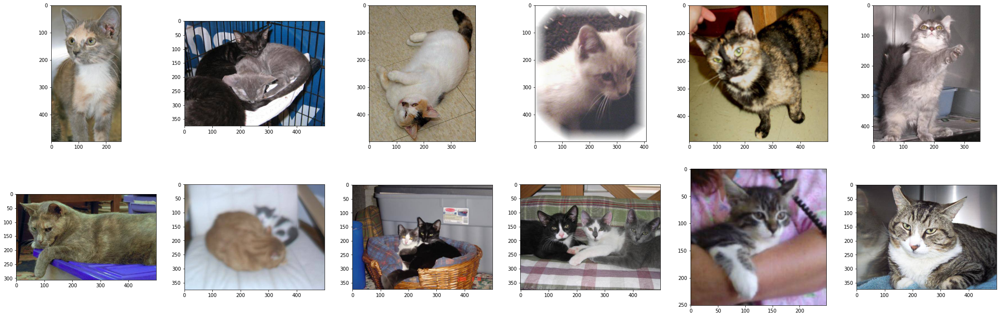

Figura 10.4


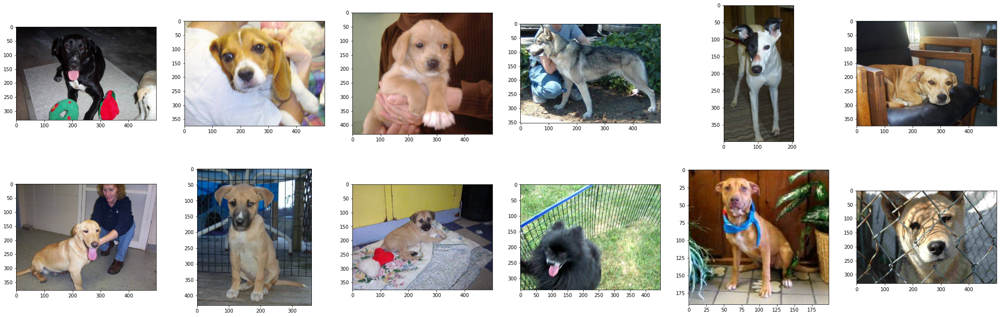

Figura 10.5


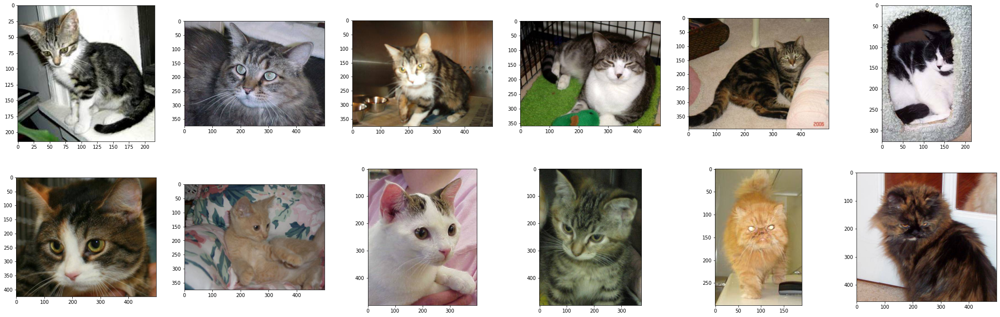

Figura 10.6


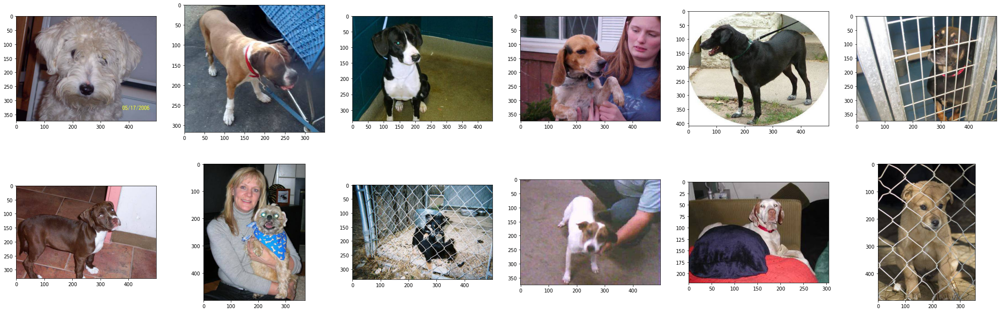

Figura 10.7


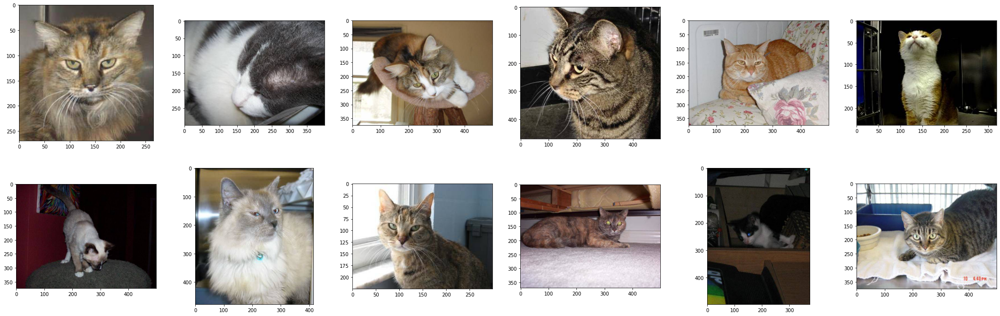

Figura 10.8


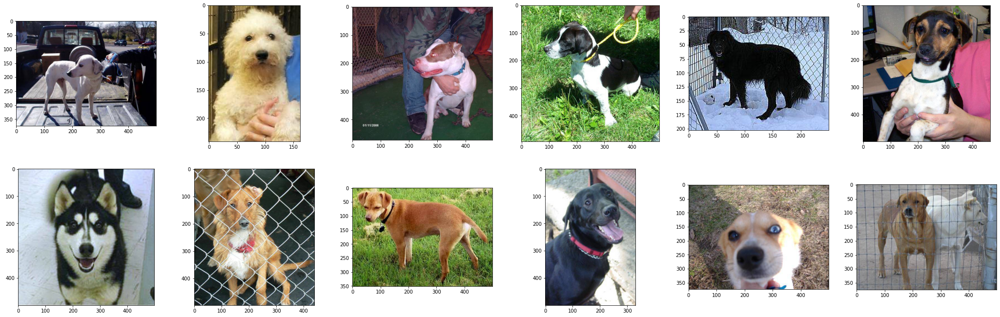

In [102]:

imprimir_fotos(train_cats_dir, train_cat_fnames)

imprimir_fotos(train_dogs_dir, train_dog_fnames)

imprimir_fotos(validation_cats_dir, validation_cat_fnames)

imprimir_fotos(validation_dogs_dir, validation_dog_fnames)

imprimir_fotos(test_cats_dir, test_cat_fnames)

imprimir_fotos(test_dogs_dir, test_dog_fnames)

MODELO DE RECONOCIMIENTO DE IMAGENES

Se puede notar que las imagenes no poseen un tamano uniforme, ni tienen la misma ecala. Entonces, dado que para entrenar una red neuronal es necesario que las imagenes tengan un tamano uniforme, fijaremos un tamano de 150 x 150 pixeles.